In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import cufflinks as cf
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
import re
import statsmodels.formula.api as smf
#import statsmodels.api as sm

In [3]:
df = pd.read_csv("""gamesnew.csv""", ).drop(columns = ["Unnamed: 0"])
df = df[~df["first_30d"].isnull()]
df = df.astype({'steam_release_date':'datetime64[ns]'})

df_cool = pd.read_csv("""games10kcool.csv""", ).drop(columns = ["Unnamed: 0"])
df_cool = df_cool[~df_cool["first_30d"].isnull()]
df_cool = df_cool.astype({'steam_release_date':'datetime64[ns]'})

In [4]:
df = pd.concat([df, df_cool])
df = df.drop_duplicates(subset = ["app_id"])
df = df.reset_index()
df = df.drop(columns = ['index'])

df = df[df['first_30d'] <= 12326]
print(min(df["steam_release_date"]))
print(max(df["steam_release_date"]))
df

1984-06-01 00:00:00
2023-03-07 00:00:00


,name,first_30d,first_90d,price,developer,publisher,genres,steam_release_date,app_id,details,series,language
0,Russian Train Trip 2,0.50,NaN,"5,89€",monavista dev,monavista pub,"['Adventure,', 'Indie,', 'Simulation,', 'Early...",2023-03-07,2190470,['Single-player'],False,{'English': 2}
1,51:22:51,0.00,NaN,"14,59€",:truman:,IshiBloom,"['Action,', 'Adventure,', 'Early', 'Access']",2023-03-07,2167190,['Single-player'],False,"{'English': 3, 'French': 3, 'Italian': 3, 'Ger..."
2,CrashOut Xtreme,0.00,NaN,"6,89€",CRX Entertainment Pte Ltd.,Favour Toys Studios B.V.,['Casual'],2023-03-07,2096650,['Single-player'],False,{'English': 1}
3,Zombie Survivors 1,0.00,NaN,"5,89€",avatar,avatar,"['Action,', 'Indie,', 'RPG']",2023-03-07,2308460,['Single-player'],False,"{'English': 1, 'Simplified Chinese': 1}"
4,Rabbi-T,0.00,NaN,Free To Play,Friday13th,ChungKang College of Cultural Industries,"['Action,', 'Free', 'to', 'Play,', 'Indie,', '...",2023-03-06,2317340,['Single-player'],False,"{'': 0, 'Korean': 1}"
...,...,...,...,...,...,...,...,...,...,...,...,...
15184,Globesweeper,29.23,12.78,"2,39€",Incandescent Games,Incandescent Games,"['Casual,', 'Indie']",2019-02-12,982220,['Single-player'],Globesweeper,{'English': 3}
15185,UuultraC,3.54,1.29,"29,99€",ADELTA,MangaGamer,"['Adventure,', 'Casual,', 'Indie']",2022-03-24,1909800,['Single-player'],False,"{'English': 2, 'Japanese': 1}"
15186,Directly Drink Milk from Cow 【直に牛乳を飲め】,0.00,NaN,"8,59€",Boujin 【棒陣】,Boujin 【棒陣】,"['Casual,', 'Indie,', 'Simulation']",2022-03-30,1924440,['Single-player'],False,"{'English': 2, 'Japanese': 3}"
15187,Elf Enchanter: Arousing Anima,1.98,1.21,"0,99€",Belgerum,Belgerum,"['Adventure,', 'Casual,', 'Indie']",2019-08-01,1031170,['Single-player'],Belgerum Games,{'English': 3}


In [5]:
df.to_excel("Primarily_df.xlsx")

In [6]:
from scipy import stats
data = [1265.16, 1265.16, 6542.84, 8018.72, 993.66, 1902.40, 4711.31, 5995.47]
stats.ttest_1samp(data, popmean=5000, alternative = "less")

Ttest_1sampResult(statistic=-1.1706283478094908, pvalue=0.14002644560521926)

# Target analyze

In [7]:
#import statsmodels.api as sm
df_2020 = df[df["steam_release_date"].dt.year >= 2020]
mu, sigma = 0, 0.1 # mean and standard deviation
# s = np.random.normal(mu, sigma, 1000)
# ax1 = sm.qqplot(df_2020["first_30d"], marker = 'o')
# sm.qqplot(s, marker = 'o')
# plt.show()

In [8]:
px.scatter(x = df["name"], y= df["first_30d"] )

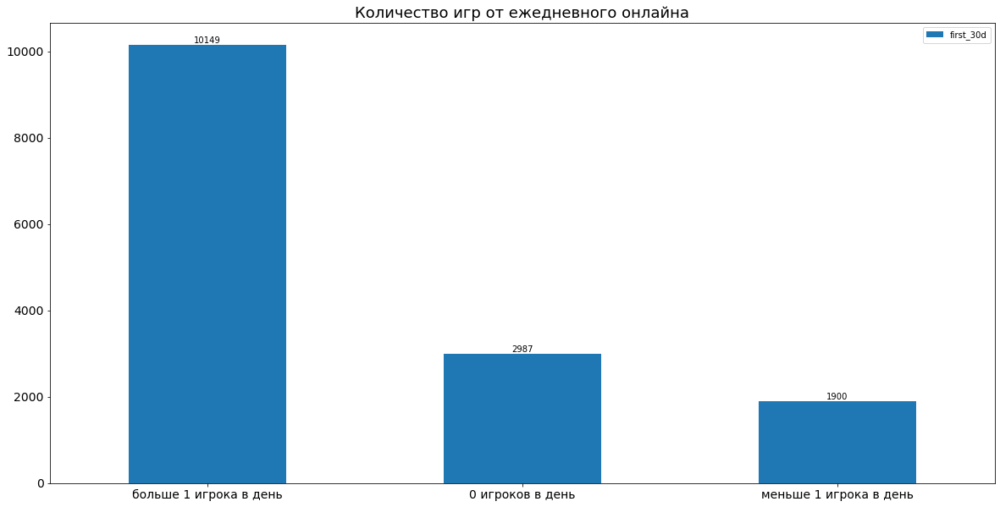

In [9]:
def zero_players(x):
    if 0 < x <= 1:
        return "меньше 1 игрока в день"
    elif x == 0:
        return "0 игроков в день"
    return "больше 1 игрока в день"
df_count = pd.DataFrame(df['first_30d'].
                        apply(lambda x: zero_players(x)).
                        value_counts()
                        )



fig, axes = plt.subplots(1, 1, figsize=(20,10))

ax = df_count.plot(kind = "bar", ax = axes, fontsize = 14)
ax.set_title('Количество игр от ежедневного онлайна', fontsize=18)
ax.bar_label(ax.containers[0])
ax.tick_params(axis='x', rotation=0 )
plt.show(fig)

In [10]:
px.scatter(x = df["name"], y= df["first_30d"] )

In [11]:
from scipy.stats import shapiro
from scipy.stats import normaltest
x = df['first_30d']
print(f"Shapiro test:{shapiro(x)}")
print(f"normal test:{normaltest(x)}")

Shapiro test:ShapiroResult(statistic=0.24795866012573242, pvalue=0.0)
normal test:NormaltestResult(statistic=19139.692842478307, pvalue=0.0)


C:\Users\dimag\anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning:

p-value may not be accurate for N > 5000.



In [12]:
fig1 = px.scatter(x = df["name"], y = df["first_30d"], title = "types of publishers")
fig1.show()

# Begin with feature engineering  
## Start with "price" column, it's needed to convert it into FLOAT type and delete all extra letters

In [13]:
def price_convert(x):
    if "€" in x:
        x = float(x.replace("€","").replace(",",".").replace("--","").strip())
    else:
        x = 0
    return x
df['price'] = df['price'].apply(lambda x: price_convert(x))
df.head()

,name,first_30d,first_90d,price,developer,publisher,genres,steam_release_date,app_id,details,series,language
0,Russian Train Trip 2,0.5,NaN,5.89,monavista dev,monavista pub,"['Adventure,', 'Indie,', 'Simulation,', 'Early...",2023-03-07,2190470,['Single-player'],False,{'English': 2}
1,51:22:51,0.0,NaN,14.59,:truman:,IshiBloom,"['Action,', 'Adventure,', 'Early', 'Access']",2023-03-07,2167190,['Single-player'],False,"{'English': 3, 'French': 3, 'Italian': 3, 'Ger..."
2,CrashOut Xtreme,0.0,NaN,6.89,CRX Entertainment Pte Ltd.,Favour Toys Studios B.V.,['Casual'],2023-03-07,2096650,['Single-player'],False,{'English': 1}
3,Zombie Survivors 1,0.0,NaN,5.89,avatar,avatar,"['Action,', 'Indie,', 'RPG']",2023-03-07,2308460,['Single-player'],False,"{'English': 1, 'Simplified Chinese': 1}"
4,Rabbi-T,0.0,NaN,0.00,Friday13th,ChungKang College of Cultural Industries,"['Action,', 'Free', 'to', 'Play,', 'Indie,', '...",2023-03-06,2317340,['Single-player'],False,"{'': 0, 'Korean': 1}"


## Developer

In [14]:
# Developer is categorical column and it shoud be transform with One Hot encoding, but in this case this columns transforms into 
# several hundreds columns, that is not appropriate for the model.
# To solve this problem, it's possile to find most success developers (says 10) and make from them separate columns
# Or divide developers into unsuccess, average, success
# To identify the best way, necessary try both of them
# Also need to try cast 0 developer to different category

# Make piechart which contains developers sum popularity
dev_success = pd.DataFrame(df.groupby("developer", as_index = False).agg(count = ('first_30d', len), summ = ('first_30d', sum)))

df_top_dev = dev_success.copy().sort_values(by = "summ", ascending =False)
df_top_dev.iloc[11:, 0] = "other"
fig = px.pie(df_top_dev, values = "summ", names = "developer", title = "developers on the market")
fig.show()

df_rapid_dev = dev_success.copy().sort_values(by = "count", ascending =False)
pd.concat([df_rapid_dev.reset_index(), df_top_dev.reset_index()], axis=1)

,index,developer,count,summ,index,developer,count,summ
0,4622,"KOEI TECMO GAMES CO., LTD.",69,44392.50,8077,Square Enix,31,53924.74
1,4654,"Kairosoft Co.,Ltd",35,855.02,4622,"KOEI TECMO GAMES CO., LTD.",69,44392.50
2,8077,Square Enix,31,53924.74,6233,Obsidian Entertainment,9,33952.90
3,1891,Creobit,28,783.49,684,Arkane Studios,7,31154.31
4,6050,Nihon Falcom,27,4017.25,1412,"CAPCOM Co., Ltd.",21,27728.47
...,...,...,...,...,...,...,...,...
10711,3930,Hippo Games,1,3.54,3530,other,2,0.00
10712,3931,Hippo Rider,1,24.12,3524,other,1,0.00
10713,3932,Historiated,1,3.00,3516,other,1,0.00
10714,3933,Hitcents,1,5.93,3515,other,1,0.00


In [15]:
fig = px.pie(df_top_dev, values = "summ", names = "developer", title = "developers on the market")

### Making 10 new column with top developers

In [16]:
# make 10 new columns with top developers and assign them their value

# top_developers = dev_success.iloc[:10]['developer']
# for dev in top_developers:
#     df[dev+"_dev"] = 0
# for i in df[df['developer'].isin(top_developers)].index:
#     df.loc[i, df.loc[i][4]+"_dev"] = 1
#df[df['developer'].isin(top_developers)]

 Due to above reasons, the best idea, I believe, is applying K-means to divide developers into 3 categories

In [17]:
#dev_success_without_zero = dev_success[dev_success['summ'] != 0]
fig = px.scatter(x = dev_success["developer"], y = dev_success["summ"], title = "dev scatter")
fig.show()

In [18]:
dev_success.sort_values(by = "summ", ascending = False).head(30)

,developer,count,summ
8077,Square Enix,31,53924.74
4622,"KOEI TECMO GAMES CO., LTD.",69,44392.50
6233,Obsidian Entertainment,9,33952.90
684,Arkane Studios,7,31154.31
1412,"CAPCOM Co., Ltd.",21,27728.47
9115,Ubisoft Montreal,18,27494.54
1727,Codemasters,9,25619.51
9106,Ubisoft,15,24412.24
2101,Dani,2,20582.62
809,Avalanche Studios,6,20533.39


In [19]:
from sklearn.cluster import KMeans
kmeans_dev = KMeans(n_clusters=3)
kmeans_dev.fit(dev_success["summ"].to_numpy().reshape(-1, 1))

kmeans_dev = pd.Series(kmeans_dev.labels_)
fig1 = px.scatter(x = dev_success["developer"], y = dev_success["summ"], color = kmeans_dev, title = "dev types")
fig1.show()

## Language
Model wil inspect only first top-seven languages

[Text(0, 0, '4738'),
 Text(0, 0, '1094'),
 Text(0, 0, '952'),
 Text(0, 0, '849'),
 Text(0, 0, '800'),
 Text(0, 0, '727'),
 Text(0, 0, '709'),
 Text(0, 0, '586'),
 Text(0, 0, '449'),
 Text(0, 0, '381')]

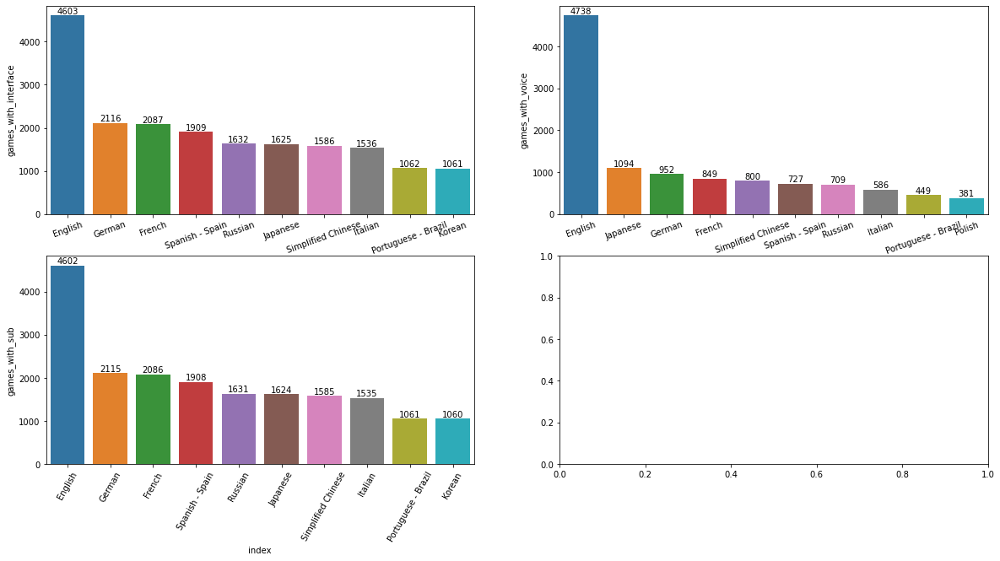

In [20]:
import ast
interface = {} # 1
subtitles = {} # 2
voice = {} # 3

# find overall language popularity 
for languages in df['language']:
    languages = ast.literal_eval(languages)
    for language in languages:
        if languages[language] == 1:
            if language in interface:
                interface[language] += 1
            else:
                interface[language] = 2
        if languages[language] == 1:
            if language in subtitles:
                subtitles[language] += 1
            else:
                subtitles[language] = 1
        if languages[language] == 3:
            if language in voice:
                voice[language] += 1
            else:
                voice[language] = 1

df_lang = pd.DataFrame(data = {"games_with_interface" : interface, "games_with_sub":subtitles, "games_with_voice":voice})
df_lang = df_lang.reset_index()

fig, axes = plt.subplots(2, 2, figsize=(20,10))
ax1 = sns.barplot(data = df_lang.sort_values(by ='games_with_interface', ascending = False).iloc[:10] \
            , y = 'games_with_interface', x = 'index', ax = axes[0, 0])
ax1.tick_params(axis='x', rotation=20)
ax1.bar_label(ax1.containers[0])

ax2 =sns.barplot(data = df_lang.sort_values(by ='games_with_sub', ascending = False).iloc[:10] \
            , y = 'games_with_sub', x = 'index', ax = axes[1, 0])
ax2.tick_params(axis='x', rotation=60)
ax2.bar_label(ax2.containers[0])

ax3 = sns.barplot(data = df_lang.sort_values(by ='games_with_voice', ascending = False).iloc[:10] \
            , y = 'games_with_voice', x = 'index', ax = axes[0, 1])
ax3.tick_params(axis='x', rotation=20)
ax3.bar_label(ax3.containers[0])


In [21]:
# Add columns with top 7 language
top_seven_languages = df_lang.sort_values(by ='games_with_interface', ascending = False).iloc[:7]['index']
for language in top_seven_languages:
    df[language + '_suppor'] = 0
    
for idx in df.index: 
    languages = ast.literal_eval(df.at[idx,'language'])
    for language in top_seven_languages:    
        df.at[idx, language+ '_suppor'] = languages.get(language, 0)
df = df.drop(columns = ['language'])

<AxesSubplot:>

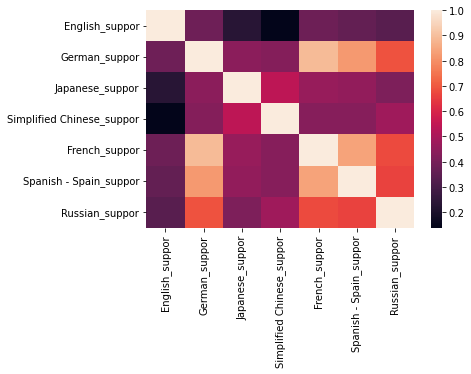

In [22]:
sns.heatmap(df[["English_suppor", "German_suppor", "Japanese_suppor", "Simplified Chinese_suppor", 
    "French_suppor", "Spanish - Spain_suppor", "Russian_suppor"]].corr())

In [23]:
np.mean(df[(df["German_suppor"] != 0) & (df["Spanish - Spain_suppor"] != 0) &  (df["Russian_suppor"] != 0)]['first_30d'])

525.2451825396826

In [24]:
np.mean(df[(df["German_suppor"] == 0) & (df["Spanish - Spain_suppor"] == 0) &  (df["Russian_suppor"] == 0)]['first_30d'])

83.95534863630753

### Publisher
Make the same research for publishers. But if publisher and developer the same, mark, that game doesn't have publisher

In [25]:
# Find  game where program wasn't able to identify publisher
df[df["publisher"].isnull()]["publisher"] = 0

In [26]:
df['publisher'] = df['publisher'].apply(lambda x: str(x).split(', ')[0])

In [27]:
df.loc[df["developer"] == df["publisher"], "publisher"] =0

publ_success = pd.DataFrame(df[df["publisher"]!= 0].
                            groupby("publisher", as_index = False).agg(count = ('first_30d', len), summ = ('first_30d', sum)))

df_top_pub = publ_success.copy().sort_values(by = "summ", ascending =False)
df_top_pub.iloc[11:, 0] = "other"
fig = px.pie(df_top_pub, values = "summ", names = "publisher", title = "Percent publisher on the market")
fig.show()

df_rapid_pub = publ_success.copy().sort_values(by = "count", ascending =False)


<AxesSubplot:xlabel='кол-во выпущенных игр', ylabel='суммарня популярность'>

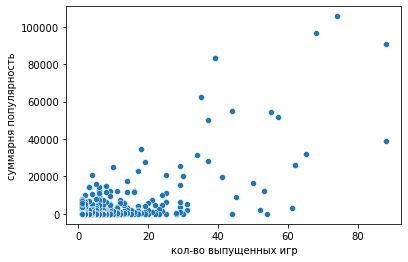

In [28]:
sns.scatterplot(
    data = df_rapid_pub.rename(columns = {"count": "кол-во выпущенных игр", "summ":"суммарня популярность"}),
    x = "кол-во выпущенных игр", y = "суммарня популярность" )

In [29]:
fig = px.scatter(x = publ_success["publisher"], y = publ_success["summ"], title = "Publisher's popularity scatter")
fig.show()

In [30]:
publ_success['summ'] = publ_success['summ']/np.sqrt(publ_success['count'])

In [31]:
publ_success.sort_values(by = "summ", ascending = False).head(30)

,publisher,count,summ
302,Bethesda Softworks,39,13317.965838
1613,SEGA,74,12278.223239
629,Electronic Arts,68,11701.971616
2046,Xbox Game Studios,35,10519.782065
2004,Warner Bros. Games,4,10468.930000
1927,Ubisoft,88,9691.148360
917,Hi-Rez Studios,3,8335.361721
106,2K,44,8308.163191
285,Bandai Namco Entertainment Inc.,3,8254.226688
1434,Paradox Interactive,37,8242.115281


In [32]:
kmeans_publ = KMeans(n_clusters=3)
kmeans_publ.fit(publ_success["summ"].to_numpy().reshape(-1, 1))
kmeans_publ = pd.Series(kmeans_publ.labels_)
fig1 = px.scatter(x = publ_success["publisher"], y = publ_success["summ"], color = kmeans_publ, title = "types of publishers")
fig1.show()

In [33]:
df_kmean_publ = pd.DataFrame({"publisher":publ_success["publisher"], "publ_type":kmeans_publ})

df_kmean_dev = pd.DataFrame({"developer":dev_success["developer"], "dev_type":kmeans_dev})

In [34]:
df = pd.merge(df, df_kmean_dev, on = ["developer"])
df = pd.merge(df, df_kmean_publ, on = ["publisher"])

In [35]:
# Encode devoleprs and publishers columns
dev_encoded = pd.get_dummies(df["dev_type"], drop_first = True,prefix = "dev_type")
pub_encoded = pd.get_dummies(df["publ_type"], drop_first = True,prefix = "publ_type")
df = pd.concat([df,dev_encoded,pub_encoded ], axis = 1)

# Now we can drop both developer and publisher columns
df = df.drop(columns = ['developer', "publisher", "dev_type", "publ_type"])

### Details column

In [36]:
print(df['details'].value_counts())

# All "details" info can be divided into Single-Player/Multiplayer games and some outliers (like In-App Purchases) which have
# a bit samples therefore can't be analyzed separately 

# Temporary decesion
df['details'] = df['details'].apply(lambda x:1 if x == "['Single-player']" else 0)
df = df.rename(columns = {'details':'single_player'})

['Single-player']                 6003
['Online PvP']                     119
['MMO']                             93
['Shared/Split Screen PvP']         18
['Online Co-op']                    13
['Steam Achievements']               5
['Shared/Split Screen Co-op']        3
['Cross-Platform Multiplayer']       2
['Steam Workshop']                   1
['Partial Controller Support']       1
['Includes level editor']            1
Name: details, dtype: int64


### Genres column

In [37]:
# get all genres

def genre_transform_to_arr(genres):
    genres = genres.strip().replace("[", "").replace("]", "").replace(",", "").replace("'Free' 'to' 'Play'","Free")\
        .replace("'", "").replace("Early Access", "Early").split(' ')
    return genres
all_genres = {}
for generes in df['genres'].values:
    genres = genre_transform_to_arr(generes)
    for genere in genres:
        if genere in all_genres:
            all_genres[genere] += 1
        else:
            all_genres[genere] = 0
            
all_genres = pd.DataFrame({"genre":all_genres.keys(), "game_count":all_genres.values()})
px.bar(all_genres, x = "genre", y = "game_count", title = "Game's genre popularity")

In [38]:
genre_to_drop = all_genres[all_genres["game_count"] < 100]["genre"]
last_genres = all_genres[all_genres["game_count"] >= 100]["genre"]
genre_to_drop

13    Utilities
Name: genre, dtype: object

In [39]:
# Transform genres to One hot encoding
for genre in all_genres["genre"].values:
    df[genre] = 0
    
for i in range(df.shape[0]):
    curr_genres = genre_transform_to_arr(df.iat[i, 4])
    for genre in curr_genres:
        df.loc[i, genre] = 1
df = df.drop(columns = ["genres"]) 
df = df.drop(columns = genre_to_drop)
df

,name,first_30d,first_90d,price,steam_release_date,app_id,single_player,series,English_suppor,German_suppor,...,Early,Action,Casual,Free,Racing,Strategy,Massively,Multiplayer,RPG,Sports
0,Russian Train Trip 2,0.50,NaN,5.89,2023-03-07,2190470,1,False,2,0,...,1,0,0,0,0,0,0,0,0,0
1,51:22:51,0.00,NaN,14.59,2023-03-07,2167190,1,False,3,3,...,1,1,0,0,0,0,0,0,0,0
2,CrashOut Xtreme,0.00,NaN,6.89,2023-03-07,2096650,1,False,1,0,...,0,0,1,0,0,0,0,0,0,0
3,Jigsaw Puzzle: Belgium Through The Lens,0.00,NaN,3.99,2022-09-21,2096670,1,False,2,0,...,0,0,1,0,0,0,0,0,0,0
4,Rabbi-T,0.00,NaN,0.00,2023-03-06,2317340,1,False,0,0,...,0,1,0,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6254,ChuSingura46+1 S,97.40,22.80,0.00,2016-06-21,464780,1,False,2,0,...,0,0,0,1,0,0,0,0,0,0
6255,Primal Carnage,119.64,99.74,7.99,2012-10-29,215470,0,Primal Carnage,2,0,...,0,1,0,0,0,0,0,0,0,0
6256,"Duke Grabowski, Mighty Swashbuckler",2.06,0.48,1.99,2016-10-06,472420,1,False,3,2,...,0,0,1,0,0,0,0,0,0,0
6257,我的纸片人女友/Make butter together!,27.65,3.52,5.69,2019-07-09,1070020,1,False,0,0,...,0,0,1,0,0,0,0,0,1,0


## Steam release date

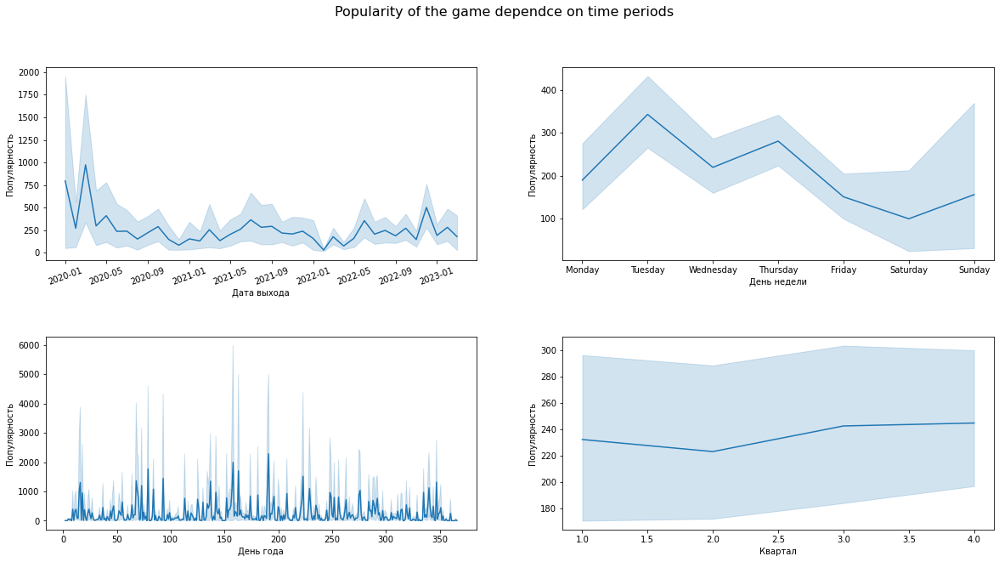

In [40]:
df_2020 = df[df["steam_release_date"].dt.year >= 2020]
fig, axes = plt.subplots(2, 2, figsize=(20,10))


df_2020['day_week'] = pd.Categorical(df_2020["steam_release_date"].dt.day_name(),
                            categories=['Monday', 'Tuesday', 'Wednesday',
                                        'Thursday', 'Friday', 'Saturday', 'Sunday'],
                            ordered=True)
df_2020["date"] = df_2020["steam_release_date"].dt.strftime("%Y-%m")
df_2020["date"] = pd.to_datetime(df_2020["date"], format='%Y-%m')
df_2020["date_year"] = df_2020["steam_release_date"].dt.dayofyear

ax1 = sns.lineplot(x = df_2020["date_year"],y = df_2020["first_30d"], ax = axes[1, 0])
ax1.set(xlabel='День года', ylabel='Популярность')
ax2 = sns.lineplot(x = df_2020['day_week'],y = df_2020["first_30d"], ax = axes[0, 1])
ax2.set(xlabel='День недели', ylabel='Популярность')
ax3 = sns.lineplot(x = df_2020["date"],y = df_2020["first_30d"], ax = axes[0, 0])
ax3.set(xlabel='Дата выхода', ylabel='Популярность')
ax3.tick_params(axis='x', rotation=20)
ax4 = sns.lineplot(x = df_2020["steam_release_date"].dt.quarter,y = df_2020["first_30d"], ax = axes[1,1])
ax4.set(xlabel='Квартал', ylabel='Популярность')

fig.suptitle('Popularity of the game dependce on time periods', fontsize=16)

fig.subplots_adjust(hspace = 0.4)
plt.show()

In [41]:
# Now I'm too weak for Fourie analyzis 

# def plot_periodogram(ts, detrend='linear', ax=None):
#     from scipy.signal import periodogram
#     fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
#     freqencies, spectrum = periodogram(
#         ts,
#         fs=fs,
#         detrend=detrend,
#         window="boxcar",
#         scaling='spectrum',
#     )
#     if ax is None:
#         _, ax = plt.subplots()
#     ax.step(freqencies, spectrum, color="purple")
#     ax.set_xscale("log")
#     ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
#     ax.set_xticklabels(
#         [
#             "Annual (1)",
#             "Semiannual (2)",
#             "Quarterly (4)",
#             "Bimonthly (6)",
#             "Monthly (12)",
#             "Biweekly (26)",
#             "Weekly (52)",
#             "Semiweekly (104)",
#         ],
#         rotation=30,
#     )
#     ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
#     ax.set_ylabel("Variance")
#     ax.set_title("Periodogram")
#     return ax

# #df_2020['steam_release_date'] = df_2020['steam_release_date'].dt.to_period('D')

# average_players = (
#     df_2020
#     .groupby('steam_release_date')['first_30d'].mean()
#     .squeeze()
# )
# plot_periodogram(average_players)


In [42]:
# from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess
# fourier = CalendarFourier(freq="A", order=4) 

# dp = DeterministicProcess(
#     index=average_players.index,
#     constant=True,               # dummy feature for bias (y-intercept)
#     order=1,                     # trend (order 1 means linear)
#     seasonal=True,               # weekly seasonality (indicators)
#     additional_terms=[fourier],  # annual seasonality (fourier)
#     drop=True,                   # drop terms to avoid collinearity
# )

# X = dp.in_sample()  # create features for dates in tunnel.index
# X = X.reset_index()
# X['steam_release_date'] = X['steam_release_date'].dt.dayofyear
# X.set_index("steam_release_date")

# model = LinearRegression(fit_intercept=False)
# model.fit(X, average_players.values)

# y_pred = model.predict(X)
# y_pred
# sns.lineplot()

In [43]:
values = df_2020.groupby('day_week')['first_30d'].apply(lambda x: list(x))
values

day_week
Monday       [0.0, 4.75, 1.04, 1.2, 5.0, 0.0, 0.16, 0.56, 0...
Tuesday      [0.5, 0.0, 0.0, 0.38, 4.15, 3.0, 0.51, 2.1, 0....
Wednesday    [0.0, 1.3, 0.75, 0.92, 0.12, 2.98, 84.76, 7.71...
Thursday     [0.03, 0.0, 1.36, 24.0, 7.87, 244.43, 76.14, 0...
Friday       [0.79, 0.6, 0.87, 2.14, 1.09, 0.78, 1.35, 1.72...
Saturday     [2.49, 5.71, 300.06, 0.9, 10.55, 0.27, 0.0, 0....
Sunday       [11.92, 2642.96, 0.0, 0.26, 0.2, 0.12, 0.34, 0...
Name: first_30d, dtype: object

In [44]:
from scipy import stats
stat, p = stats.f_oneway(values[0], values[1], values[2], values[3], values[4], values[5], values[6])
stat, p

(3.771497283258042, 0.0009525707885531188)

In [45]:
from scipy import stats
stats.ttest_ind(values[2], values[4], alternative = "greater")

Ttest_indResult(statistic=1.5827833017780402, pvalue=0.05685228555267309)

## Genre analyze
Graphics show number of games which were developed in certain time
Can see below, that almost all genres have quite good correlation (except Sports and Racing)
Genres don't have vivid cyclic time, so I decided not get it.
You will see at this section, that hyped genre doesn't exist


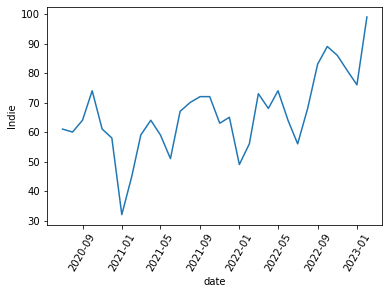

In [46]:
df["date"] = df["steam_release_date"].dt.strftime("%Y-%m")
df["date"] = pd.to_datetime(df["date"], format='%Y-%m')
df_ = df[(df["date"] >= "2020-07") & (df["date"] < "2023-03")]
grouped_data = df_.groupby("date")[last_genres].sum().reset_index()
grouped_data
ax = sns.lineplot(x = grouped_data["date"], y = grouped_data["Indie"])
ax.tick_params(axis='x', rotation=60)

          date   variable  value
0   2020-07-01  Adventure     43
1   2020-08-01  Adventure     35
2   2020-09-01  Adventure     35
3   2020-10-01  Adventure     56
4   2020-11-01  Adventure     42
..         ...        ...    ...
411 2022-10-01     Sports      7
412 2022-11-01     Sports      8
413 2022-12-01     Sports     11
414 2023-01-01     Sports      7
415 2023-02-01     Sports     10

[416 rows x 3 columns]


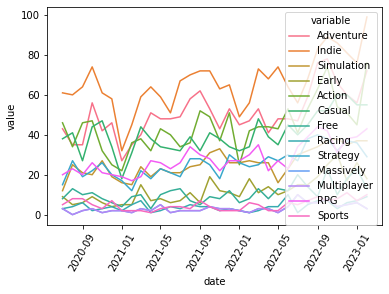

In [47]:
melted_data = pd.melt(grouped_data, ['date'])
print(melted_data)
ax = sns.lineplot(x='date', y='value', hue='variable', 
             data=pd.melt(grouped_data, ['date']))  # Grant useful method!!!!
ax.tick_params(axis='x', rotation=60)

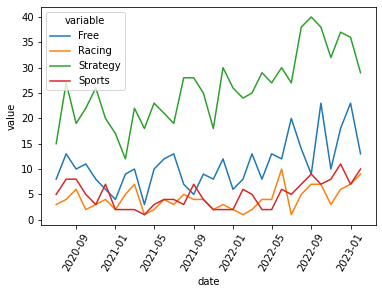

In [48]:
melted_data[melted_data["variable"].isin(["Sports", "Racing"])]
ax = sns.lineplot(x='date', y='value', hue='variable', 
             data=melted_data[melted_data["variable"].isin(["Sports", "Racing","Free", "Strategy"])]) 
ax.tick_params(axis='x', rotation=60)

<AxesSubplot:>

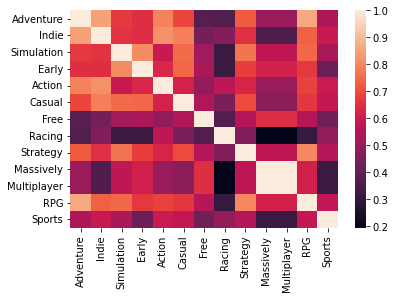

In [49]:
sns.heatmap(grouped_data.drop(columns = ["date"]).corr())

Text(0.5, 0.98, 'Выделение трендовой и циклической части')

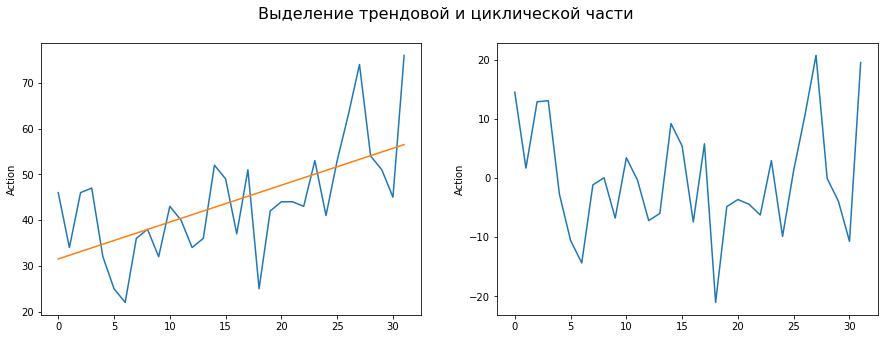

In [50]:
# Demosntrate trend 
fig, axes = plt.subplots(1, 2, figsize=(15,5))

line_model = LinearRegression()
numbs = np.array([i for i in range(0, grouped_data.shape[0])]).reshape(-1, 1)
line_model.fit(numbs, grouped_data["Action"] )
line_model.score(numbs, grouped_data["Action"] )
predicted = line_model.predict(numbs)
sns.lineplot(x = np.array([i for i in range(0, grouped_data.shape[0])]), y= grouped_data["Action"], ax = axes[0])
sns.lineplot(x = np.array([i for i in range(0, grouped_data.shape[0])]), y= predicted, ax = axes[0])

# Remove trend from time series
# As we can see,there isn't vivid cycles 
action_without_trend = grouped_data["Action"] - predicted
sns.lineplot(x = np.array([i for i in range(0, grouped_data.shape[0])]), y= action_without_trend, ax = axes[1])
fig.suptitle('Выделение трендовой и циклической части', fontsize=16)

In [51]:
print(line_model.intercept_)
print(line_model.coef_)
print(line_model.score(numbs,grouped_data["Action"]))

31.50568181818181
[0.80608504]
0.37794904301283694


<AxesSubplot:xlabel='month', ylabel='Action'>

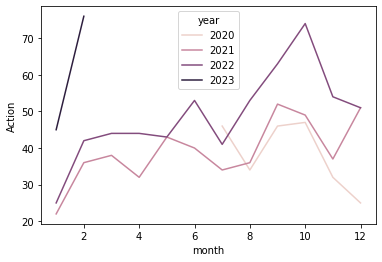

In [52]:
grouped_data['year'] = grouped_data['date'].dt.year
grouped_data['month'] = grouped_data['date'].dt.month
grouped_data
sns.lineplot(data = grouped_data, x = 'month', y = 'Action', hue = 'year')

## Number of realised games

In [53]:
all_games_cnt = grouped_data.melt("date").groupby("date").agg(summ = ("value",sum)).reset_index()
px.line(x = all_games_cnt["date"], y = all_games_cnt["summ"])

0.6187981532572274


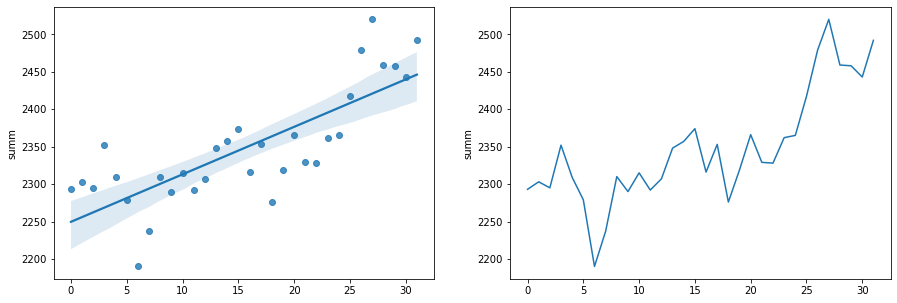

In [54]:

model = LinearRegression()
model.fit(all_games_cnt.index.to_numpy().reshape(-1, 1), all_games_cnt["summ"])

fig, axes = plt.subplots(1, 2, figsize=(15,5))
print(model.score(all_games_cnt.index.to_numpy().reshape(-1, 1), all_games_cnt["summ"]))
predicted_values = model.predict(all_games_cnt.index.to_numpy().reshape(-1, 1))
sns.regplot(x = all_games_cnt.index, y = all_games_cnt["summ"], ax = axes[0])
sns.lineplot(x = all_games_cnt.index, y = all_games_cnt["summ"], ax = axes[1])
px.line(x = all_games_cnt.index, y = all_games_cnt["summ"] - predicted_values )

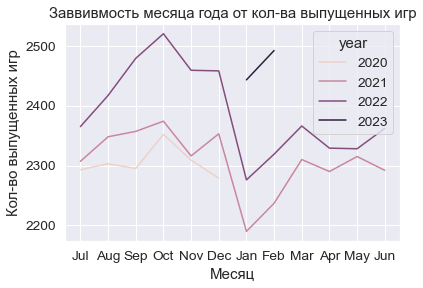

In [55]:
all_games_cnt['year'] = all_games_cnt['date'].dt.year
all_games_cnt['month'] = all_games_cnt['date'].dt.strftime('%b')


sns.set(font_scale=1.25)
b = sns.lineplot(x = all_games_cnt['month'], y = all_games_cnt['summ'], hue = all_games_cnt['year'])
b.axes.set_title("Заввивмость месяца года от кол-ва выпущенных игр")
b.set_xlabel("Месяц")
b.set_ylabel("Кол-во выпущенных игр")
b.tick_params()

In [56]:
print(model.intercept_)
print(model.coef_)
print(model.score(all_games_cnt.index.to_numpy().reshape(-1, 1), all_games_cnt["summ"]))
pd.DataFrame(data = {"all_games":all_games_cnt["summ"], "Action":grouped_data["Action"]}).corr()

2249.625
[6.34072581]
0.6187981532572274


,all_games,Action
all_games,1.000000,0.860679
Action,0.860679,1.000000


## Is game part of franchise

In [57]:
df_franchise = pd.read_excel("franchises.xlsx")
df_franchise

,N,Name
0,1,Age of Wonders
1,2,Alan Wake
2,3,Alex Kidd
3,4,Alien Breed
4,5,Alien vs. Predator
...,...,...
492,493,Baldur's Gate: Dark Alliance
493,494,Call of Juarez
494,495,Dead to Rights
495,496,Growlanser


In [58]:
def franchise_part(x):
    global df_franchise
    for franch in df_franchise['Name']:
        if x.lower().startswith(franch.lower()):
           # print(f"franchise: {franch.lower()},  game: {x.lower()}")
            return franch.lower()
    return 0
df['has_franchise'] = df['name'].apply(lambda x: franchise_part(x))

In [59]:
df[df['has_franchise'] != 0]
franch_pop = dict(df['has_franchise'].value_counts())
#df['has_franchise'] = df['has_franchise'].apply(lambda x:0 if x == 0 else 1)
df['has_franchise'] = df['has_franchise'].apply(lambda x:0 if x == 0 else franch_pop[x])

<AxesSubplot:xlabel='has_franchise', ylabel='first_30d'>

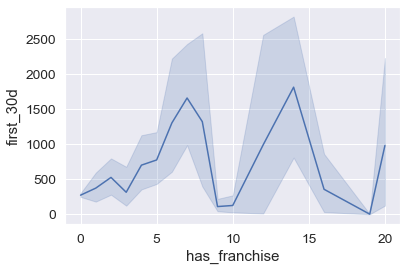

In [60]:
sns.lineplot(x = df['has_franchise'], y = df['first_30d'])

## Is game part of the series? 
To identify is current game new part of existing game I will catch games with NUMBER at the end of the game's name
To be sure, that this game have previous versions and digit is not a part of game's name I will look for game with the same name

In [61]:
df['series'] = df['series'].apply(lambda x:x.split(', ')[0])
#df['series'] = df['series'].apply(lambda x: 0 if x == "False" else 1)
trash = df['series'].value_counts() # 15031 
series_popularity = pd.DataFrame(data = {"seria_name": trash.index})
series_popularity['seria_pop'] = series_popularity['seria_name'].apply(lambda x:np.mean(df[df['series'] == x]['first_30d']))

px.scatter(x = series_popularity['seria_name'],y= series_popularity['seria_pop'])
kmeans_publ = KMeans(n_clusters=4)
kmeans_publ.fit(series_popularity['seria_pop'].to_numpy().reshape(-1, 1))
kmeans_publ = pd.Series(kmeans_publ.labels_)
series_popularity['seria_rank'] = kmeans_publ

trash = pd.DataFrame(trash).reset_index()
series_popularity = series_popularity.merge(trash, left_on = "seria_name", right_on = "index").drop(columns = ['index'])
df = df.merge(series_popularity, left_on = "series", right_on = "seria_name").\
    drop(columns = ['seria_name']).rename(columns = {'series_y':'count_series_games'})
df['seria_pop'] = df['seria_pop'] - (df['first_30d']/df['count_series_games'])
df.loc[df['series_x'] == "False", ["seria_pop", "count_series_games"]] = 0


px.scatter(x = series_popularity['seria_name'],y= series_popularity['seria_pop'], color = kmeans_publ)

# Ultimate decesion about date

In [62]:
df['steam_release_weekday'] = df['steam_release_date'].dt.dayofweek
df['steam_release_quarter'] = df['steam_release_date'].dt.quarter

# Building models

## Linear model

In [97]:
from sklearn.model_selection import train_test_split
#df["first_30d"] = np.log(df["first_30d"]+1) # due to skew distribution in first_30d log tranformation have great impact on 
# quality of the equation
#df["first_30d"]  = np.exp(df["first_30d"])-1 # reverse tranformation|
col_to_drop = ["first_90d","first_30d", "app_id",'date', "steam_release_date", "date", "series_x", "seria_pop"]
cat_advice = ['steam_release_weekday', 'Racing', 'single_player', 'Sports',
      'Strategy']
col_to_drop += cat_advice 
col_to_drop_ = col_to_drop.copy()
col_to_drop_.append("steam_release_date")
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns= col_to_drop_), df["first_30d"], 
                                                    test_size=0.33, random_state= 24)

In [70]:
df.drop(columns= col_to_drop_).to_excel("ultra_df.xlsx")

In [71]:
reg = LinearRegression()

reg.fit(X_train, y_train )
print(f"score on trained data {reg.score(X_train, y_train)}")
print(f"score on tested data {reg.score(X_test, y_test)}")

score on trained data 0.4093574952764115
score on tested data 0.384639901319771


In [72]:
feature_impact = pd.DataFrame({"feature":X_train.columns, "coeff":reg.coef_ })
feature_impact.sort_values(by = 'coeff', ascending = False)

,feature,coeff
8,dev_type_1,1729.741521
9,dev_type_2,1166.322949
11,publ_type_2,575.937827
24,seria_rank,569.991819
18,Free,366.774377
10,publ_type_1,255.510622
20,Multiplayer,191.392183
19,Massively,191.392183
7,Simplified Chinese_suppor,91.815929
5,Russian_suppor,89.104599


In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6259 entries, 0 to 6258
Data columns (total 39 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   name                       6259 non-null   object        
 1   first_30d                  6259 non-null   float64       
 2   first_90d                  4816 non-null   float64       
 3   price                      6259 non-null   float64       
 4   steam_release_date         6259 non-null   datetime64[ns]
 5   app_id                     6259 non-null   int64         
 6   single_player              6259 non-null   int64         
 7   series_x                   6259 non-null   object        
 8   English_suppor             6259 non-null   int64         
 9   German_suppor              6259 non-null   int64         
 10  French_suppor              6259 non-null   int64         
 11  Spanish - Spain_suppor     6259 non-null   int64         
 12  Russia

In [74]:
df

,name,first_30d,first_90d,price,steam_release_date,app_id,single_player,series_x,English_suppor,German_suppor,...,Multiplayer,RPG,Sports,date,has_franchise,seria_pop,seria_rank,count_series_games,steam_release_weekday,steam_release_quarter
0,Russian Train Trip 2,0.50,NaN,5.89,2023-03-07,2190470,1,False,2,0,...,0,0,0,2023-03-01,0,0.0,0,0,1,1
1,51:22:51,0.00,NaN,14.59,2023-03-07,2167190,1,False,3,3,...,0,0,0,2023-03-01,0,0.0,0,0,1,1
2,CrashOut Xtreme,0.00,NaN,6.89,2023-03-07,2096650,1,False,1,0,...,0,0,0,2023-03-01,0,0.0,0,0,1,1
3,Jigsaw Puzzle: Belgium Through The Lens,0.00,NaN,3.99,2022-09-21,2096670,1,False,2,0,...,0,0,0,2022-09-01,0,0.0,0,0,2,3
4,Rabbi-T,0.00,NaN,0.00,2023-03-06,2317340,1,False,0,0,...,0,0,0,2023-03-01,0,0.0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6254,Out There: Ω Edition,60.35,10.53,14.99,2015-04-02,334420,1,Mi-Clos Studio,3,2,...,0,1,0,2015-04-01,0,0.0,0,1,3,2
6255,Seven: Enhanced Edition,80.17,26.32,29.99,2017-12-01,471010,1,IMGN.PRO,3,2,...,0,1,0,2017-12-01,0,0.0,0,1,4,4
6256,SiNKR 2,2.17,0.43,3.99,2019-05-09,973220,1,SiNKR,1,1,...,0,0,0,2019-05-01,7,0.0,0,1,3,2
6257,Snood,2.89,1.71,0.00,2018-12-25,964040,1,Snood,1,0,...,0,0,0,2018-12-01,0,0.0,0,1,1,4


## Build Cat Boost

In [119]:
from sklearn.model_selection import train_test_split
#df["first_30d"] = np.log(df["first_30d"]+1) # due to skew distribution in first_30d log tranformation have great impact on 
# quality of the equation
#df["first_30d"]  = np.exp(df["first_30d"])-1 # reverse tranformation|
col_to_drop = ["first_90d","first_30d", "app_id",'date', "steam_release_date", "date", "series_x"]
cat_advice = ['steam_release_weekday', 'Racing', 'single_player', 'Sports',
      'Strategy']
col_to_drop += cat_advice 
col_to_drop_ = col_to_drop.copy()
col_to_drop_.append("steam_release_date")
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns= col_to_drop_), df["first_30d"], 
                                                    test_size=0.33, random_state= 24)

In [120]:
from catboost import CatBoostRegressor, Pool, EShapCalcType, EFeaturesSelectionAlgorithm
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns= col_to_drop), df["first_30d"], 
                                                    test_size=0.33)

In [121]:
X_test

,name,price,English_suppor,German_suppor,French_suppor,Spanish - Spain_suppor,Russian_suppor,Japanese_suppor,Simplified Chinese_suppor,dev_type_1,...,Casual,Free,Massively,Multiplayer,RPG,has_franchise,seria_pop,seria_rank,count_series_games,steam_release_quarter
5276,ASTLIBRA Revision,20.99,2,0,0,0,0,2,2,0,...,0,0,0,0,1,0,11.875000,0,2,4
4241,Helldorado,9.99,1,1,1,1,0,0,0,0,...,0,0,0,0,0,0,246.565000,0,4,2
3953,STAR WARS™ - Knights of the Old Republic™,8.19,3,3,3,1,0,0,0,0,...,0,0,0,0,1,20,874.986364,2,22,4
3514,The Demon Lord is New in Town!,20.99,2,0,0,0,0,3,2,0,...,0,0,0,0,1,0,51.053167,0,60,1
5319,Port Royale 4,39.99,3,3,3,3,3,3,2,0,...,0,0,0,0,0,0,53.260000,0,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,Children of a Dead Earth,16.79,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.000000,0,0,3
4656,寄居隅怪奇事件簿 Hermitage Strange Case Files,8.19,0,0,0,0,0,0,2,0,...,0,0,0,0,0,0,0.000000,0,1,4
2664,Lost Alone,1.99,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.000000,0,0,2
4064,Ni no Kuni Wrath of the White Witch™ Remastered,49.99,3,2,2,2,2,3,0,0,...,0,0,0,0,1,0,1367.664286,2,14,3


In [122]:

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()





feature_names = ['F{}'.format(i) for i in range(X_train.drop(columns =['name']).shape[1])]
train_pool = Pool(X_train.drop(columns =['name']), y_train, feature_names=feature_names)
test_pool = Pool(X_test.drop(columns =['name']), y_test, feature_names=feature_names)


model = CatBoostRegressor(silent = True, depth = 5, l2_leaf_reg = 1, iterations = 1000, learning_rate = 0.03)


In [123]:
# summary = model.select_features(
#                 train_pool,
#                 eval_set=test_pool,
#                 features_for_select='0-33',
#                 num_features_to_select=10,
#                 steps=3,
#                 algorithm=EFeaturesSelectionAlgorithm.RecursiveByShapValues,
#                 shap_calc_type=EShapCalcType.Regular,
#                 train_final_model=True,
#                 logging_level='Silent',
#                 plot=True)

In [124]:
# grid = {'learning_rate': [0.03, 0.02, 0.01, 0.1],
#         'depth': [1, 2,3, 4, 5],
#         'l2_leaf_reg': [1, 3],
#        'iterations':[100, 500, 700, 1000]
#        }

# randomized_search_result = model.grid_search(grid,
#                                                    X=X_train,
#                                                    y=y_train,
#                                                    plot=True
#                                                    )

#randomized_search_result['params'] # {'depth': 4, 'l2_leaf_reg': 3, 'iterations': 1000, 'learning_rate': 0.03}


In [125]:
model.fit(X_train.drop(columns =['name']), y_train)
print(model.score(X_train.drop(columns =['name']),y_train)) # 0.590384165697444
model.score(X_test.drop(columns =['name']),y_test)      
# 0.46 
# 0.50 - depth to 4 & add dayofweek 
# 0.515 - leave steam_release_data
# 0.52 - number of frunchise games
# 0.579 - divide series into 3 groups
# 0.61 - divide series into 4 groups
# 0.625 - publisher_pop like summ_pop/sqrt(count_games)
# 0.632 - delete columns by catBoost advice

0.8995290240122025


0.6670222015275555

In [92]:
X_test

,name,price,English_suppor,German_suppor,French_suppor,Spanish - Spain_suppor,Russian_suppor,Japanese_suppor,Simplified Chinese_suppor,dev_type_1,...,Casual,Free,Massively,Multiplayer,RPG,has_franchise,seria_pop,seria_rank,count_series_games,steam_release_quarter
2923,TwelveSky 2 Classic,0.00,2,0,0,0,0,0,0,0,...,0,1,1,1,0,0,0.000000,0,0,1
1881,Shadow Madness,12.49,3,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0.000000,0,0,1
5290,Escape from Naraka,1.99,3,2,2,2,2,2,2,0,...,0,0,0,0,0,0,15.819333,0,15,3
4486,DOOM 3,9.99,2,2,2,2,0,2,0,1,...,0,0,0,0,0,5,1940.067500,2,4,4
756,Fraymakers,16.79,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.000000,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6053,PlanetSide 2,0.00,1,1,1,1,1,0,1,1,...,0,1,1,1,0,0,0.000000,3,1,4
1065,Broken Edge,9.99,1,1,1,0,0,1,0,0,...,0,0,0,0,0,0,0.000000,0,0,4
439,Sunrider Academy,0.00,2,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0.000000,0,0,2
653,HighFleet,24.99,3,0,0,0,3,0,0,0,...,0,0,0,0,0,0,0.000000,0,0,3


In [149]:
from sklearn.metrics import r2_score
predicted =  model.predict(X_test.drop(columns =['name']))
predicted = [abs(i) for i in predicted]
r2_score(y_test, predicted)

0.6675445365494022

In [151]:
X_final = X_test.copy()
X_final['real_popularity'] = y_test
X_final['predicted_populairy'] = predicted
X_final[["name", "real_popularity", "predicted_populairy"]].sort_values(by = "real_popularity", ascending = False)

,name,real_popularity,predicted_populairy
3763,DRAGON BALL Z: KAKAROT,11558.78,4123.017814
6053,PlanetSide 2,11458.69,7516.852773
5179,Resident Evil 2,11281.02,4275.572858
1088,Forza Horizon 4,10623.73,3374.895484
5977,Rise of the Tomb Raider™,10274.28,5134.790325
...,...,...,...
4638,Fancy the Frog,0.00,40.008232
726,GirlPuzzle 2,0.00,59.360262
4535,CosmicBreak Gun & Slash,0.00,114.380382
1481,Star Trust - 3D Shooter Game,0.00,1.517316


# Problem with immense games
I encountered with problem of outliers and unbalanced data. data frame doesn't contains enough instances of them. 
It was indicated by score, which change from 0.2 to 0.83
So I should either remove them from data frame or find new examples or try do something with developer/publisher parameter

## Removing publisher/developer columns
Result: obvious, it was an awful idea :) Results are also awful 0.04 score Linear model. About catBoost I don't want to talk